In [67]:
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt # plotting
import numpy as np # linear algebra
import os # accessing directory structure
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv

from skimage import io
import tensorflow as tf
import PIL
os.chdir('/home/juanp.montoya/NeuralNetworks/Final_Project')


In [35]:
# print(os.getcwd())
for dirname, _, filenames in os.walk('input/'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

input/class_dict.csv
input/metadata.csv
input/train/61245_mask.png
input/train/807146_mask.png
input/train/958443_sat.jpg
input/train/338798_mask.png
input/train/416794_mask.png
input/train/589940_mask.png
input/train/103665_mask.png
input/train/40168_mask.png
input/train/114433_sat.jpg
input/train/831146_sat.jpg
input/train/559477_sat.jpg
input/train/461001_mask.png
input/train/838873_sat.jpg
input/train/254565_sat.jpg
input/train/137806_mask.png
input/train/605764_sat.jpg
input/train/392711_mask.png
input/train/561117_mask.png
input/train/983603_sat.jpg
input/train/45357_mask.png
input/train/485061_sat.jpg
input/train/533952_mask.png
input/train/458776_sat.jpg
input/train/457070_mask.png
input/train/978039_sat.jpg
input/train/544464_mask.png
input/train/541060_sat.jpg
input/train/997521_sat.jpg
input/train/505217_sat.jpg
input/train/664396_mask.png
input/train/505217_mask.png
input/train/622733_sat.jpg
input/train/468103_sat.jpg
input/train/56924_mask.png
input/train/428327_sat.jpg
i

In [36]:
# Distribution graphs (histogram/bar graph) of column data
def plotPerColumnDistribution(df, nGraphShown, nGraphPerRow):
    nunique = df.nunique()
    df = df[[col for col in df if nunique[col] > 1 and nunique[col] < 50]] # For displaying purposes, pick columns that have between 1 and 50 unique values
    nRow, nCol = df.shape
    columnNames = list(df)
    nGraphRow = (nCol + nGraphPerRow - 1) / nGraphPerRow
    plt.figure(num = None, figsize = (6 * nGraphPerRow, 8 * nGraphRow), dpi = 80, facecolor = 'w', edgecolor = 'k')
    for i in range(min(nCol, nGraphShown)):
        plt.subplot(nGraphRow, nGraphPerRow, i + 1)
        columnDf = df.iloc[:, i]
        if (not np.issubdtype(type(columnDf.iloc[0]), np.number)):
            valueCounts = columnDf.value_counts()
            valueCounts.plot.bar()
        else:
            columnDf.hist()
        plt.ylabel('counts')
        plt.xticks(rotation = 90)
        plt.title(f'{columnNames[i]} (column {i})')
    plt.tight_layout(pad = 1.0, w_pad = 1.0, h_pad = 1.0)
    plt.show()

In [37]:
# Correlation matrix
def plotCorrelationMatrix(df, graphWidth):
    filename = df.dataframeName
    df = df.dropna('columns') # drop columns with NaN
    df = df[[col for col in df if df[col].nunique() > 1]] # keep columns where there are more than 1 unique values
    if df.shape[1] < 2:
        print(f'No correlation plots shown: The number of non-NaN or constant columns ({df.shape[1]}) is less than 2')
        return
    corr = df.corr()
    plt.figure(num=None, figsize=(graphWidth, graphWidth), dpi=80, facecolor='w', edgecolor='k')
    corrMat = plt.matshow(corr, fignum = 1)
    plt.xticks(range(len(corr.columns)), corr.columns, rotation=90)
    plt.yticks(range(len(corr.columns)), corr.columns)
    plt.gca().xaxis.tick_bottom()
    plt.colorbar(corrMat)
    plt.title(f'Correlation Matrix for {filename}', fontsize=15)
    plt.show()

In [38]:
# Scatter and density plots
def plotScatterMatrix(df, plotSize, textSize):
    df = df.select_dtypes(include =[np.number]) # keep only numerical columns
    # Remove rows and columns that would lead to df being singular
    df = df.dropna('columns')
    df = df[[col for col in df if df[col].nunique() > 1]] # keep columns where there are more than 1 unique values
    columnNames = list(df)
    if len(columnNames) > 10: # reduce the number of columns for matrix inversion of kernel density plots
        columnNames = columnNames[:10]
    df = df[columnNames]
    ax = pd.plotting.scatter_matrix(df, alpha=0.75, figsize=[plotSize, plotSize], diagonal='kde')
    corrs = df.corr().values
    for i, j in zip(*plt.np.triu_indices_from(ax, k = 1)):
        ax[i, j].annotate('Corr. coef = %.3f' % corrs[i, j], (0.8, 0.2), xycoords='axes fraction', ha='center', va='center', size=textSize)
    plt.suptitle('Scatter and Density Plot')
    plt.show()

In [39]:
nRowsRead = 1000 # specify 'None' if want to read whole file
# class_dict.csv may have more rows in reality, but we are only loading/previewing the first 1000 rows
df1 = pd.read_csv('input/class_dict.csv', delimiter=',', nrows = nRowsRead)
df1.dataframeName = 'class_dict.csv'
nRow, nCol = df1.shape
print(f'There are {nRow} rows and {nCol} columns')

There are 7 rows and 4 columns


In [43]:
df1

,name,r,g,b
0,urban_land,0,255,255
1,agriculture_land,255,255,0
2,rangeland,255,0,255
3,forest_land,0,255,0
4,water,0,0,255
5,barren_land,255,255,255
6,unknown,0,0,0


<ipython-input-36-0121bf3d9d74>:10: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(nGraphRow, nGraphPerRow, i + 1)
<ipython-input-36-0121bf3d9d74>:10: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(nGraphRow, nGraphPerRow, i + 1)


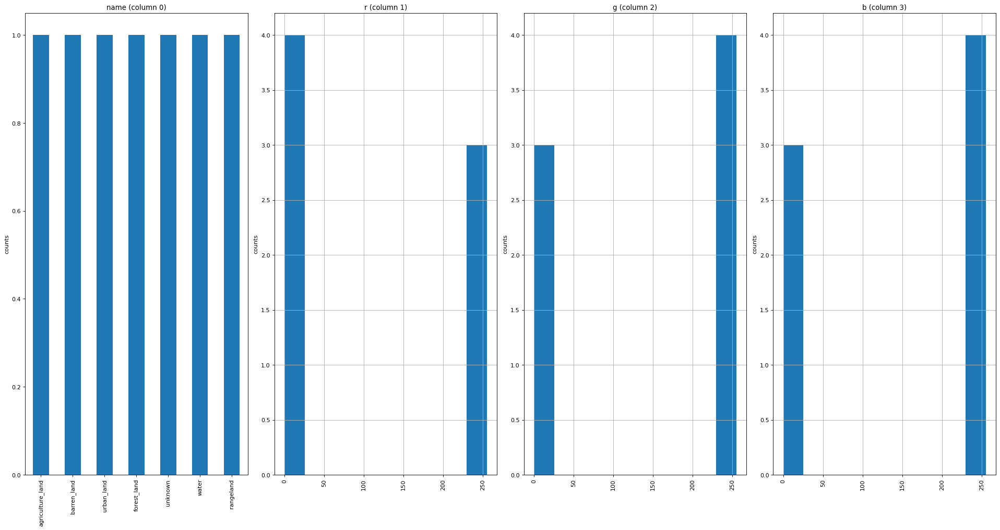

In [40]:
plotPerColumnDistribution(df1, 10, 5)

In [ ]:
plotCorrelationMatrix(df1, 8)

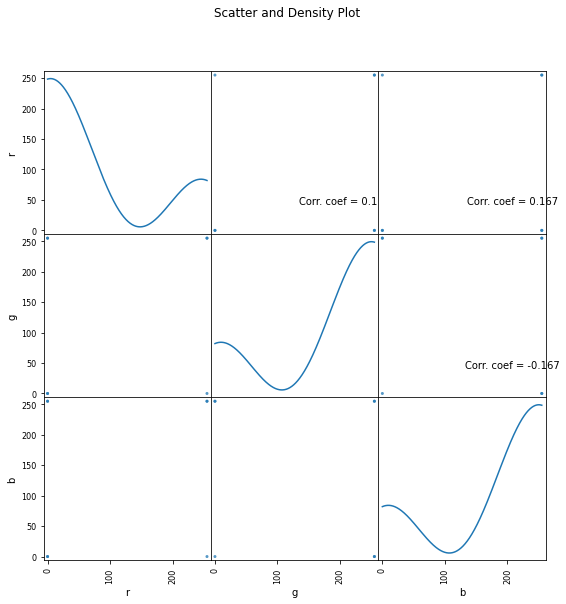

In [41]:
plotScatterMatrix(df1, 9, 10)

In [45]:
nRowsRead = 1000 # specify 'None' if want to read whole file
# metadata.csv may have more rows in reality, but we are only loading/previewing the first 1000 rows
df2 = pd.read_csv('input/metadata.csv', delimiter=',', nrows = nRowsRead)
df2.dataframeName = 'metadata.csv'
nRow, nCol = df2.shape
print(f'There are {nRow} rows and {nCol} columns')

There are 1000 rows and 4 columns


In [46]:
def visualize(**images):
    """
    Plot images in one row
    """
    n_images = len(images)
    plt.figure(figsize=(20,8))
    for idx, (name, image) in enumerate(images.items()):
        plt.subplot(1, n_images, idx + 1)
        plt.xticks([]); 
        plt.yticks([])
        # get title from the parameter names
        plt.title(name.replace('_',' ').title(), fontsize=20)
        plt.imshow(image)
    plt.show()

In [63]:
df2.mask_path

0      train/100694_mask.png
1      train/102122_mask.png
2       train/10233_mask.png
3      train/103665_mask.png
4      train/103730_mask.png
               ...          
995                      NaN
996                      NaN
997                      NaN
998                      NaN
999                      NaN
Name: mask_path, Length: 1000, dtype: object

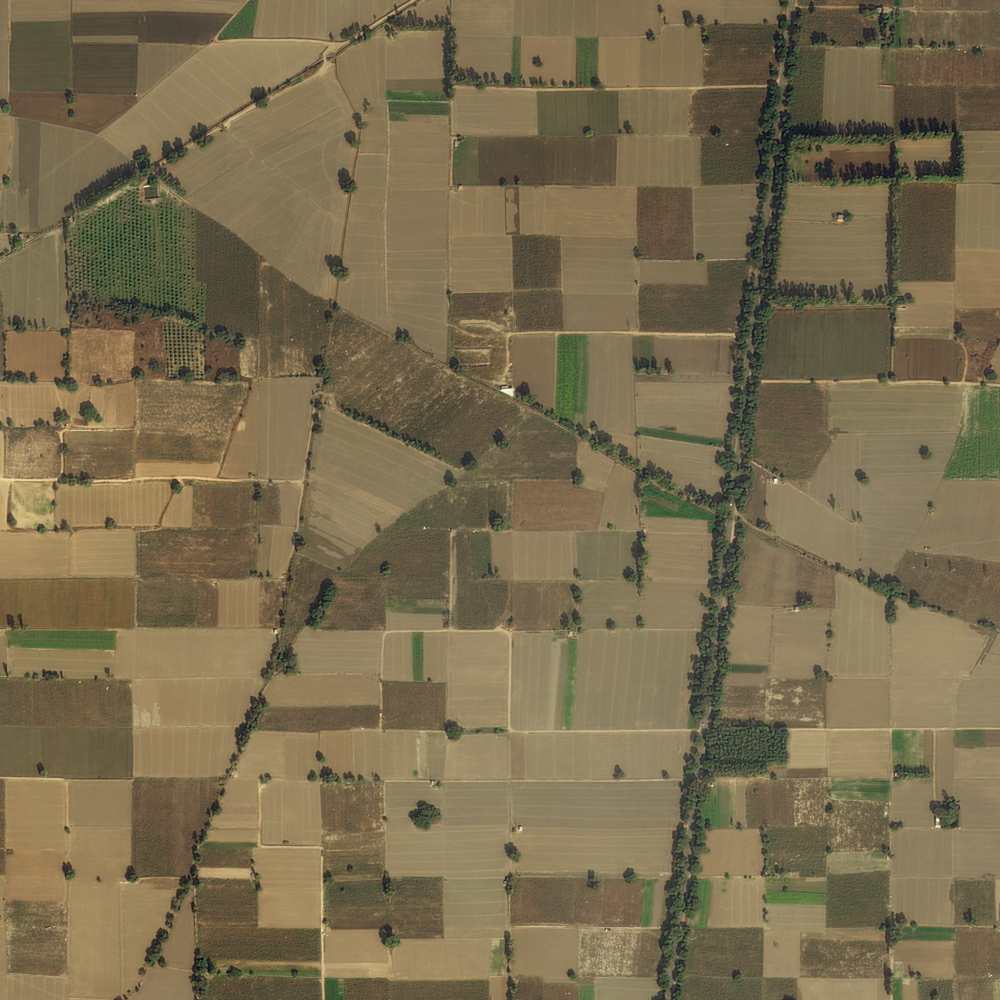

In [65]:
PIL.Image.open('input/train/100694_sat.jpg')


In [72]:
a = PIL.Image.open('input/train/100694_mask.png')


SyntaxError: invalid syntax (<ipython-input-72-0bcbd219b496>, line 2)

In [74]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  'input/',
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(2448, 2448),
  batch_size=50)
train_ds

Found 1949 files belonging to 4 classes.
Using 1560 files for training.


<BatchDataset shapes: ((None, 2448, 2448, 3), (None,)), types: (tf.float32, tf.int32)>

In [75]:
train_ds.class_names

['.ipynb_checkpoints', 'test', 'train', 'valid']

FileNotFoundError: [Errno 2] No such file or directory: 'train/100694_sat.jpg'

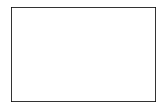

In [57]:
# image = io.imread(img_path)

def plot_sat_imgs(paths):
    plt.figure(figsize = (15, 8))
    for i in range(20):
        plt.subplot(4, 5, i+1, xticks = [], yticks = [])
        img = PIL.Image.open(paths[i], 'r')
        plt.imshow(np.asarray(img))
        plt.title(paths[i].split('/')[-2])
        
plot_sat_imgs(df2.sat_image_path)

In [ ]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  'input/',
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)